In [2]:
#%matplotlib inline

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from HeaderP import *
from astropy.io import fits
from tqdm import trange
plt.rcParams.keys()
plt.rc('font', family='serif')
params = {
   'axes.labelsize': 30,
   'axes.linewidth': 1.5,
   'legend.fontsize': 25,
   'legend.frameon': False,
   'lines.linewidth': 2,
   'xtick.direction': 'in',
   'xtick.labelsize': 25,
   'xtick.major.bottom': True,
   'xtick.major.pad': 10,
   'xtick.major.size': 10,
   'xtick.major.width': 1,
   'xtick.minor.bottom': True,
   'xtick.minor.pad': 3.5,
   'xtick.minor.size': 5,
   'xtick.minor.top': True,
   'xtick.minor.visible': True,
   'xtick.minor.width': 1,
   'xtick.top': True,
   'ytick.direction': 'in',
   'ytick.labelsize': 25,
   'ytick.major.pad': 10,
   'ytick.major.size': 10,
   'ytick.major.width': 1,
   'ytick.minor.pad': 3.5,
   'ytick.minor.size': 5,
   'ytick.minor.visible': True,
   'ytick.minor.width': 1,
   'ytick.right': True,
   'figure.figsize': [10,10], # instead of 4.5, 4.5
   'savefig.format': 'eps',
   }
plt.rcParams.update(params)

def fitpoints(x,y):
    z = np.polyfit(x,y,1)
    p = np.poly1d(z)
    return p


def movingMed_time(x,y,x_window,delta_x_window):
    # medians output
    x_med=np.zeros(len(x))
    y_med=np.zeros(len(y))

    # define the boundaries of the windows
    if len(x)==0:
        return x_med,y_med
    window_min=float(min(x))
    window_max=float(window_min+delta_x_window)
    
    # max time
    maxtime=max(x)
    
    # break when time window hits the end
    while window_max<=maxtime+x_window:
        seldf=(x>=window_min) & (x<=window_max) # get points between the window
        
        x_med[seldf]=np.median(x[seldf]) # all values for these indices are subsituded with median time
        y_med[seldf]=np.median(y[seldf]) # all values for these indices are subsituded with median flux
        
        # slide the window
        window_min=window_min+delta_x_window
        window_max=window_max+delta_x_window
    return x_med, y_med

def calcgrad(age,abund,age_err,abund_err):
    zs=np.zeros(100)
    for i in trange(100):
        newage=np.array([np.random.normal(age[k], age_err[k],1)[0] for k in range(len(age))])
        newabund=np.array([np.random.normal(abund[k], abund_err[k],1)[0] for k in range(len(abund))])
        zs[i] = np.polyfit(newage,newabund,1)[0]     
    return np.mean(zs),np.std(zs)

def makeagemap_each(R,z,ageval,lims,binnum):
    x1,x2,y1,y2 = lims[0], lims[1], lims[2], lims[3]
    
    R = np.array(R)
    z = np.array(z)
    ageval = np.array(ageval) 
    
    xval = R
    yval = z
    wval = ageval 
    
    x1m,x2m,y1m,y2m = lims[0], lims[1], lims[2], lims[3]
    
    hist1,x2,y2 = np.histogram2d(xval, yval, weights = wval, bins= binnum, range = ((x1m,x2m), (y1m,y2m)))
    hist1_norm,x3,y3 = np.histogram2d(xval, yval, bins = binnum, range = ((x1m,x2m), (y1m,y2m)))

    image = hist1/hist1_norm  
    
    masked_array = np.ma.array (image, mask=np.isnan(image))
    
    return masked_array

/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/utils/__init__.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:18: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Iterable
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:16: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping, namedtuple, defaultdict, Sequence
/Users/lucy/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module 

before cutting: 116301


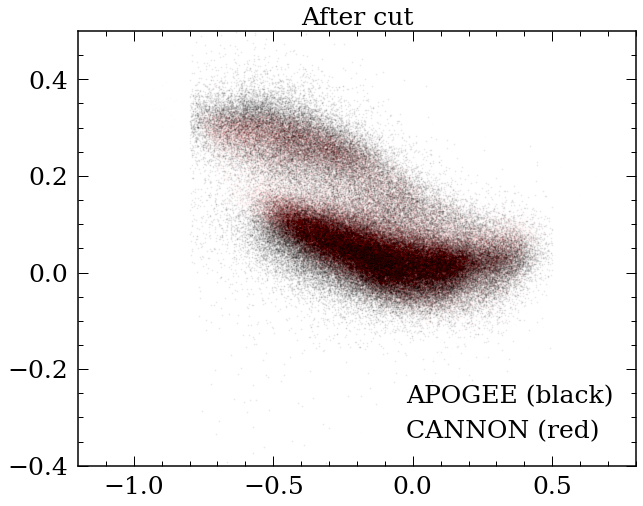

In [3]:
df=pd.read_pickle('CannonDR16.pkl')
print('before cutting:',len(df))

plt.figure(figsize=(10,8))
plt.scatter(df['M_H'],df['MG_FE'],c='k',alpha=0.05,s=1,label='APOGEE (black)')
plt.scatter(df['[Fe/H]'],df['[Mg/Fe]'],c='r',alpha=0.01,s=1,label='CANNON (red)')
plt.xlim([-1.2,0.8])
plt.ylim([-0.4,0.5])
plt.title('After cut',fontsize=25)
plt.legend()

#np.mean(np.sqrt(df['LogAge_err']**2+0.2**2)/df['LogAge'])



In [4]:
#ageup=df['LogAge']+np.sqrt(df['LogAge_err']**2+0.2**2)
#agelow=df['LogAge']-np.sqrt(df['LogAge_err']**2+0.2**2)

ageup=df['LogAge']+0.2
agelow=df['LogAge']-0.2

print(np.mean((10**ageup-10**agelow)/2/10**df['LogAge']))

0.47696792399071614


In [5]:
print(len(df))
df=df.loc[df['Age_err']<5]
print(len(df))
df=df.loc[df['SNR']>100]
print(len(df))

116301
106236
83137


14040 69097 83137


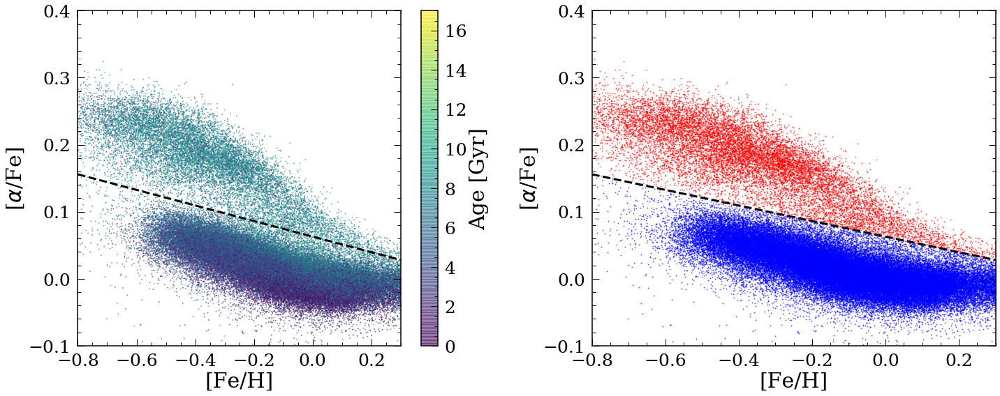

In [6]:
p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['ALPHA_M'],c=df['Age'],s=1,vmin=0,vmax=17,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['ALPHA_M']-p(df['M_H'])>=0]
low_alpha=df[df['ALPHA_M']-p(df['M_H'])<0]
print(len(high_alpha),len(low_alpha),len(df))

p=fitpoints([-0.75,0.11],[0.15,0.05])

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['ALPHA_M'],c='r',s=1,alpha=0.5)
plt.scatter(low_alpha['M_H'],low_alpha['ALPHA_M'],c='b',s=1,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')

plt.tight_layout()

100%|██████████| 49/49 [00:30<00:00,  1.59it/s]


Text(0.5, 1.0, 'All stars')

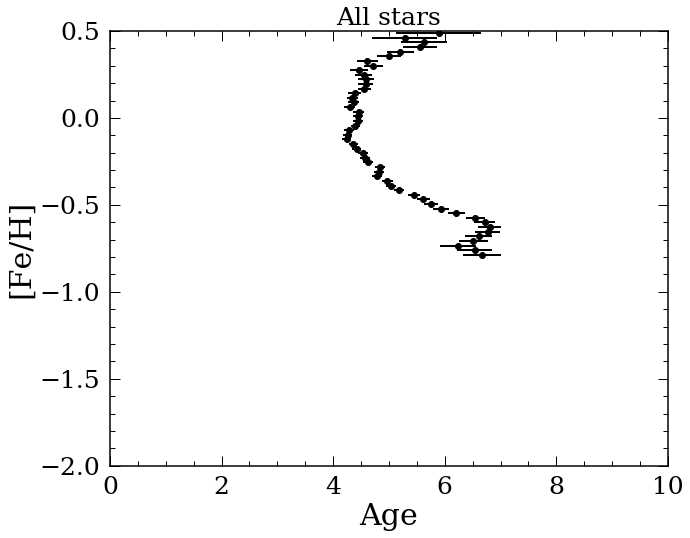

In [7]:
def getave_age(age,feh):
    Nbin=50
    febins=np.linspace(-0.8,0.5,Nbin)
    
    meanage=np.zeros(Nbin-1)
    meanage_err=np.zeros(Nbin-1)
    meanfeh=np.zeros(Nbin-1)
    starnumb=np.zeros(Nbin-1)
    for i in trange(Nbin-1):
        binlow=febins[i]
        binhi=febins[i+1]
        #print(binlow,binhi)

        m=(feh>=binlow)&(feh<=binhi)
        
        if sum(m)==0:
            continue
        meanfeh[i]=(binlow+binhi)/2
        #print(sum(m))
        
        meanage[i]=np.mean(age[m])
        meanage_err[i]=(max(age[m])-min(age[m]))/2./np.sqrt(sum(m))
        starnumb[i]=sum(m)
    return meanfeh,meanage,meanage_err,starnumb
    
df=df.dropna(subset=['M_H','Age'])
plt.figure(figsize=(10,8))
meanfeh,meanage,meanage_err,starnumb=getave_age(df['Age'].values,df['M_H'].values)
#plt.scatter(df_rc['Age'],df_rc['M_H'],c='r',s=1,alpha=0.5)
plt.errorbar(meanage,meanfeh,xerr=meanage_err,fmt='ko')
plt.xlim([0,10])
plt.ylim([-2,0.5])
plt.xlabel('Age')
plt.ylabel('[Fe/H]')
plt.title('All stars',fontsize=25)

https://arxiv.org/pdf/2002.07183.pdf

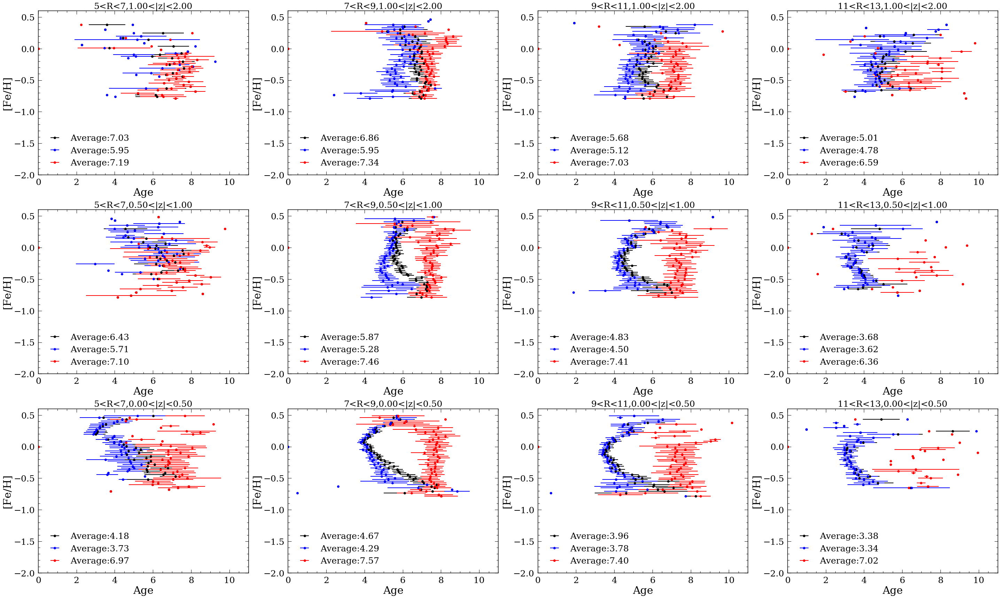

In [8]:
#Rbin=[5,7,9,11,13]
#zbin=[0,0.5,1,2]
Rbin=[2,1,0.5,0]
zbin=[5,7,9,11,13]
plt.figure(figsize=(40,24))
count=1
for i in range(len(Rbin)-1):
    df_all=df.loc[df['z']>Rbin[i+1]]
    df_all=df_all.loc[df_all['z']<Rbin[i]]
        
    for j in range(len(zbin)-1):
        df_all_z=df_all.loc[abs(df_all['R'])>zbin[j]]
        df_all_z=df_all_z.loc[abs(df_all_z['R'])<zbin[j+1]]
        
        df_all_z=df_all_z.dropna(subset=['M_H','Age'])
        
        ha_bin_z=df_all_z[df_all_z['ALPHA_M']-p(df_all_z['M_H'])>=0]
        la_bin_z=df_all_z[df_all_z['ALPHA_M']-p(df_all_z['M_H'])<0]
        
        #meanfeh,meanage,meanage_err,starnumb=getave_age(df_all_z['Age'].values,df_all_z['M_H'].values)
        allage=np.append(la_bin_z['Age'].values,ha_bin_z['Age'].values)
        allmh=np.append(la_bin_z['M_H'].values,ha_bin_z['M_H'].values)
        meanfeh,meanage,meanage_err,starnumb=getave_age(allage,allmh)
        meanfeh_la,meanage_la,meanage_err_la,starnumb_la=getave_age(la_bin_z['Age'].values,
                                                                    la_bin_z['M_H'].values)
        meanfeh_ha,meanage_ha,meanage_err_ha,starnumb_ha=getave_age(ha_bin_z['Age'].values,
                                                                    ha_bin_z['M_H'].values)
        clear_output(wait = True)
        plt.subplot(3,4,count)
        plt.errorbar(meanage,meanfeh,xerr=meanage_err,fmt='ko',label='Average:%.2f'%np.mean(allage))
        plt.errorbar(meanage_la,meanfeh_la,xerr=meanage_err_la,fmt='bo',label='Average:%.2f'%np.mean(la_bin_z['Age']))
        plt.errorbar(meanage_ha,meanfeh_ha,xerr=meanage_err_ha,fmt='ro',label='Average:%.2f'%np.mean(ha_bin_z['Age']))
        #plt.xlim([0,10])
        #plt.ylim([-2,0.5])
        plt.xlabel('Age')
        plt.ylabel('[Fe/H]')
        #plt.title('All stars',fontsize=25)

        #plt.scatter(ha_bin['Age'],ha_bin['M_H'],c='r',alpha=0.5)
        #plt.scatter(la_bin['Age'],la_bin['M_H'],c='b',alpha=0.5)
        plt.xlim([0,11])
        plt.ylim([-2,0.6])
        plt.legend()
        count=count+1
        plt.title('%d<R<%d,%.2f<|z|<%.2f'%(zbin[j],zbin[j+1],Rbin[i+1],Rbin[i]),fontsize=25)
        plt.tight_layout()
        
plt.savefig('FeAge.png')

In [9]:
df_plot=df.loc[abs(df['[Fe/H]'])<0.1]

In [10]:
df_plot

,ID,[Fe/H],T_{eff},Log(g),[Mg/Fe],DP,Dnu,LogAge,[Fe/H]_err,T_{eff}_err,...,LOGG_SPEC,FLAGREAD,X,Y,z,R,Age,Age_err,LogAge_upp,LogAge_low
179,2M19444192+4105009,-0.046807,4788.838124,2.380956,0.075182,183.593174,3.891220,3.580927,0.013556,0.028918,...,2.7355,0,0.520856,-1.955611,0.296915,7.924246,3.810016,1.977998,6270.863731,2314.868129
182,2M19444489+4116177,0.083954,4865.254184,2.646958,-0.076475,229.132297,5.317794,3.592127,0.012513,0.028783,...,2.9423,0,0.369045,-1.402428,0.214899,7.955543,3.909554,2.002883,6395.621132,2389.855932
185,2M19445634+4124300,-0.000974,5017.670987,3.300046,-0.011780,113.981594,14.700868,3.574411,0.017121,0.050438,...,3.5398,0,0.358273,-1.374994,0.211442,7.961362,3.753284,1.908455,6119.076925,2302.167666
186,2M19450118+4135207,0.008879,4572.659167,2.410126,0.121836,285.456890,3.928058,3.702256,0.011802,0.020920,...,2.6547,0,0.523980,-2.035301,0.315525,7.941268,5.037976,2.525732,8161.379272,3109.915754
190,2M19450489+4109386,-0.073075,4834.349750,2.512783,-0.007077,322.074661,4.032540,3.376476,0.012416,0.026403,...,2.8684,0,0.221736,-0.838621,0.126866,8.022218,2.379449,1.215330,3887.183794,1456.524223
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
245292,2M13280930+3357114,0.086669,4881.788653,3.267015,0.045018,81.151622,15.287385,3.703356,0.013634,0.039219,...,3.4006,0,0.045262,-0.181503,1.015703,8.156758,5.050755,2.523893,8170.144957,3122.359645
245445,2M15293395+4209572,-0.052360,4977.427475,3.277032,0.027016,93.097965,17.124025,3.745856,0.016188,0.044226,...,3.5735,0,0.240648,-0.609396,0.921081,7.982647,5.570008,2.806871,9044.139324,3430.397588
245479,2M15333764+4346524,0.018572,4888.813917,3.328433,0.025190,90.776985,16.802133,3.899237,0.017072,0.045997,...,3.5494,0,0.285907,-0.823373,1.177502,7.956809,7.929333,3.996877,12876.592734,4882.838364
245486,2M15343532+4331285,-0.021317,4562.942519,2.424942,0.031869,110.293007,3.087101,3.916447,0.010866,0.020503,...,2.5745,0,0.158439,-0.444087,0.634419,8.053814,8.249871,4.053534,13245.460990,5138.392562


In [11]:
zbin=[6,7,8,9,10,11,12,13]
count=1

agewindow=0.5
slidwindow=0.1

slopes_ha=[]
slopes_la=[]
slopes_ha_err=[]
slopes_la_err=[]
agemid=[]
    
plotele='N_FE'

for i in range(len(zbin)-1):
    print(i/(len(Rbin)-1))
    clear_output(wait = True)
    
    df_all=df_plot.loc[df_plot['R']>zbin[i]]
    df_all=df_all.loc[df_all['R']<zbin[i+1]]
    
    print(len(df_all))
    
    df_all_z=df_all.dropna(subset=[plotele,'Age'])
    df_all_z=df_all_z.loc[df_all_z[plotele]>-100]
    df_all_z=df_all_z.loc[df_all_z[plotele+'_ERR']>0]
        
    df_all_z=df_all_z.loc[df_all_z['Age']>2]
    
    ha_bin_z=df_all_z[df_all_z['ALPHA_M']-p(df_all_z['M_H'])>=0]
    la_bin_z=df_all_z[df_all_z['ALPHA_M']-p(df_all_z['M_H'])<0]
        
    ha_bin_z=ha_bin_z.sort_values(by=['Age'])
    la_bin_z=la_bin_z.sort_values(by=['Age']) 
        
    lag,lag_err=calcgrad(la_bin_z['Age'].values,la_bin_z[plotele].values,
                            la_bin_z['Age_err'].values,la_bin_z[plotele+'_ERR'].values)
    hag,hag_err=calcgrad(ha_bin_z['Age'].values,ha_bin_z[plotele].values,
                            ha_bin_z['Age_err'].values,ha_bin_z[plotele+'_ERR'].values)
    
    slopes_ha.append(hag)
    slopes_la.append(lag)
    slopes_ha_err.append(hag_err)
    slopes_la_err.append(lag_err)
    agemid.append(zbin[i]/2+zbin[i+1]/2)




 14%|█▍        | 14/100 [00:00<00:00, 132.87it/s]

330


100%|██████████| 100/100 [00:00<00:00, 2376.98it/s]


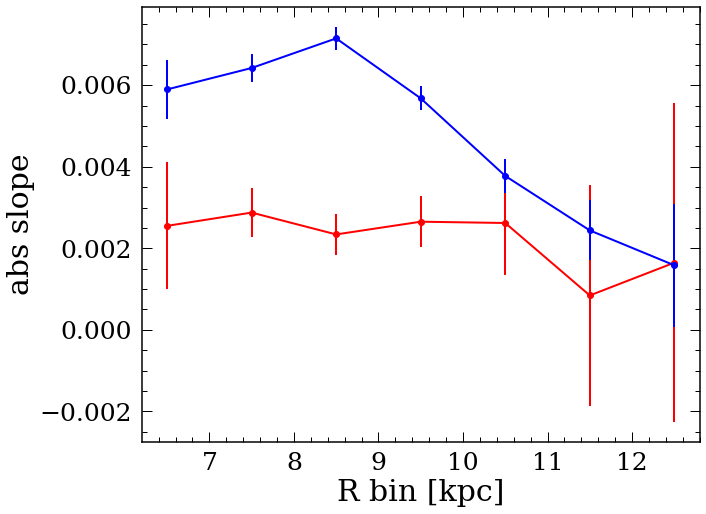

In [217]:
plt.figure(figsize=(10,8))
plt.errorbar(agemid,abs(np.array(slopes_ha)),yerr=np.array(slopes_ha_err),fmt='r-o')
plt.errorbar(agemid,abs(np.array(slopes_la)),yerr=np.array(slopes_la_err),fmt='b-o')
plt.ylabel('abs slope')
plt.xlabel('R bin [kpc]')

pd.DataFrame(np.array((agemid,slopes_ha,slopes_la,slopes_ha_err,slopes_la_err)).T,
            columns=['Rbin','ha_slope','la_slope','ha_slope_err','la_slope_err']).to_pickle('Figures/R_trend.pkl')

100%|██████████| 6/6 [00:05<00:00,  1.07it/s]


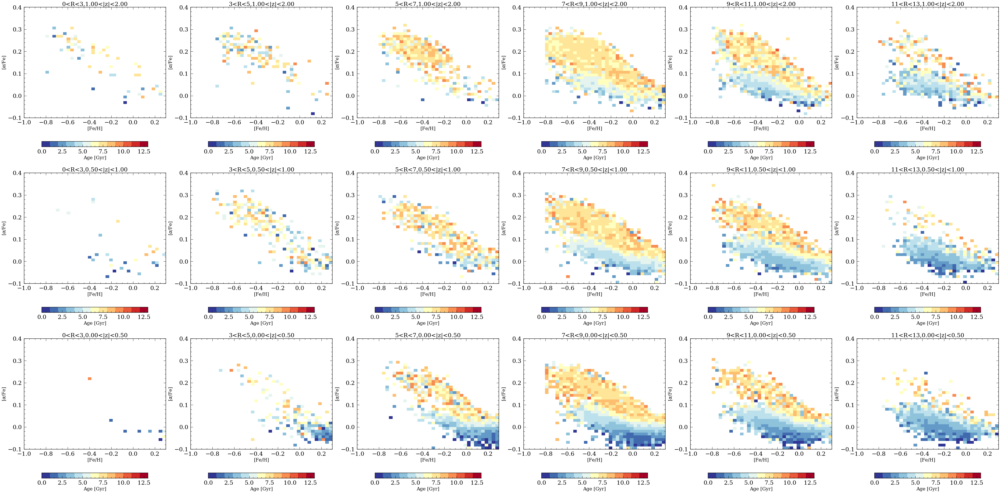

In [96]:
from scipy.ndimage import gaussian_filter

Rbin=[2,1,0.5,0]
zbin=[0,3,5,7,9,11,13]
plt.figure(figsize=(len(zbin)*10-10,len(Rbin)*10-10))
count=1

x1,x2,y1,y2 = -1,0.3,-0.1,0.4
lims = [x1,x2,y1,y2]
lims = np.array(lims)
binnum = 40

df=df.loc[df['Age_err']<5]

for i in range(len(Rbin)-1):
    print(i/(len(Rbin)-1))
    clear_output(wait = True)
    
    df_all=df.loc[df['z']>Rbin[i+1]]
    df_all=df_all.loc[df_all['z']<Rbin[i]]
        
    for j in trange(len(zbin)-1):
        df_all_z=df_all.loc[abs(df_all['R'])>zbin[j]]
        df_all_z=df_all_z.loc[abs(df_all_z['R'])<zbin[j+1]]
        
        
        plt.subplot(len(Rbin)-1,len(zbin)-1,count)
        image=makeagemap_each(df_all_z['M_H'].values,df_all_z['ALPHA_M'].values,
                df_all_z['Age'].values,lims, binnum)
        
        
        cmap1 = plt.cm.get_cmap('RdYlBu_r',13)
        cmap1.set_bad('white',1.)
    
        x1m,x2m,y1m,y2m = lims[0], lims[1], lims[2], lims[3]
        
        plt.imshow(image.T, interpolation="nearest" ,aspect = 'auto',origin = 'lower', 
                   extent = (x1m,x2m, y1m,y2m),cmap=cmap1, vmin=0,vmax=13)
 
        plt.subplots_adjust(bottom=0.20)
        plt.xlabel("[Fe/H]",fontsize = 20,labelpad =5)
        plt.ylabel("[$\\alpha$/Fe]" ,fontsize = 20)
    
        cb=plt.colorbar(orientation = 'horizontal', shrink=.75)
        fs = 20
        cb.set_label('Age [Gyr]',fontsize = fs,labelpad = 5)
        fs = 30 
        
        plt.xlim(x1m,x2m)
        plt.ylim(y1m,y2m)

        count=count+1
        plt.title('%d<R<%d,%.2f<|z|<%.2f'%(zbin[j],zbin[j+1],Rbin[i+1],Rbin[i]),fontsize=25)
        plt.tight_layout()
plt.savefig('agespacial.png')

100%|██████████| 6/6 [00:05<00:00,  1.05it/s]


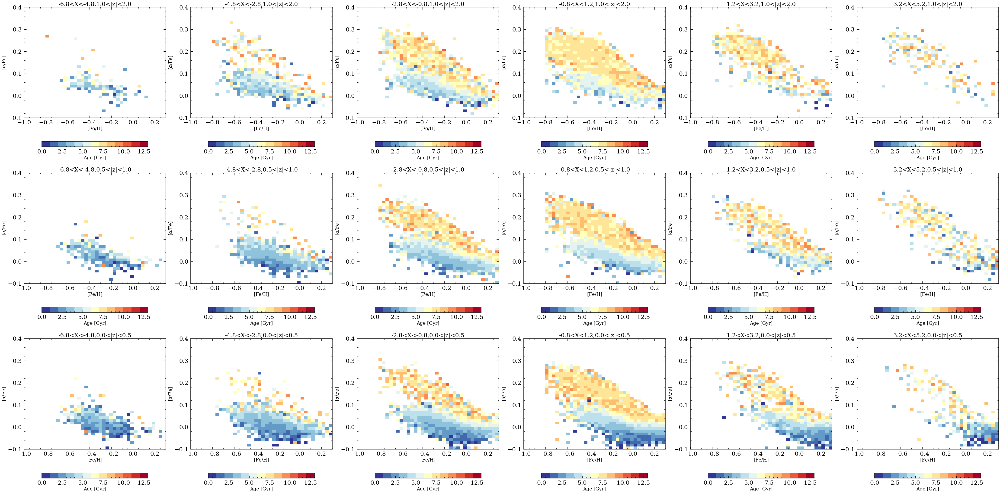

In [108]:
from scipy.ndimage import gaussian_filter

Rbin=[2,1,0.5,0]
zbin=np.array([-6,-4,-2,0,2,4,6])-0.8
plt.figure(figsize=(len(zbin)*10-10,len(Rbin)*10-10))
count=1

x1,x2,y1,y2 = -1,0.3,-0.1,0.4
lims = [x1,x2,y1,y2]
lims = np.array(lims)
binnum = 40

df=df.loc[df['Age_err']<5]

for i in range(len(Rbin)-1):
    print(i/(len(Rbin)-1))
    clear_output(wait = True)
    
    df_all=df.loc[df['z']>Rbin[i+1]]
    df_all=df_all.loc[df_all['z']<Rbin[i]]
        
    for j in trange(len(zbin)-1):
        df_all_z=df_all.loc[(df_all['X'])>zbin[j]]
        df_all_z=df_all_z.loc[(df_all_z['X'])<zbin[j+1]]
        
        
        plt.subplot(len(Rbin)-1,len(zbin)-1,count)
        image=makeagemap_each(df_all_z['M_H'].values,df_all_z['ALPHA_M'].values,
                df_all_z['Age'].values,lims, binnum)
        
        
        cmap1 = plt.cm.get_cmap('RdYlBu_r',13)
        cmap1.set_bad('white',1.)
    
        x1m,x2m,y1m,y2m = lims[0], lims[1], lims[2], lims[3]
        
        plt.imshow(image.T, interpolation="nearest" ,aspect = 'auto',origin = 'lower', 
                   extent = (x1m,x2m, y1m,y2m),cmap=cmap1, vmin=0,vmax=13)
 
        plt.subplots_adjust(bottom=0.20)
        plt.xlabel("[Fe/H]",fontsize = 20,labelpad =5)
        plt.ylabel("[$\\alpha$/Fe]" ,fontsize = 20)
    
        cb=plt.colorbar(orientation = 'horizontal', shrink=.75)
        fs = 20
        cb.set_label('Age [Gyr]',fontsize = fs,labelpad = 5)
        fs = 30 
        
        plt.xlim(x1m,x2m)
        plt.ylim(y1m,y2m)

        count=count+1
        plt.title('%.1f<X<%.1f,%.1f<|z|<%.1f'%(zbin[j],zbin[j+1],Rbin[i+1],Rbin[i]),fontsize=25)
        plt.tight_layout()
plt.savefig('agespacial_x.png')

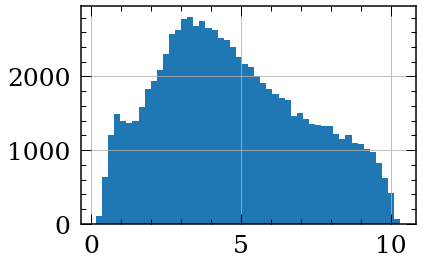

In [36]:
df['Age'].hist(bins=50)

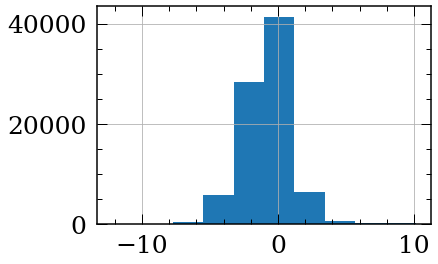

In [52]:
df['X']=df['X']

# Find gas in small alpha-Fe plane and trace their age

In [156]:
gasAlpha=[0.15,0.2]
gasFe=[-0.55,-0.45]

#gasAlpha=[-0.075,-0.025]
#gasFe=[-0.1,0.1]
df_gas=df.loc[df['ALPHA_M']>gasAlpha[0]]
df_gas=df_gas.loc[df_gas['ALPHA_M']<gasAlpha[1]]
df_gas=df_gas.loc[df_gas['FE_H']>gasFe[0]]
df_gas=df_gas.loc[df_gas['FE_H']<gasFe[1]]


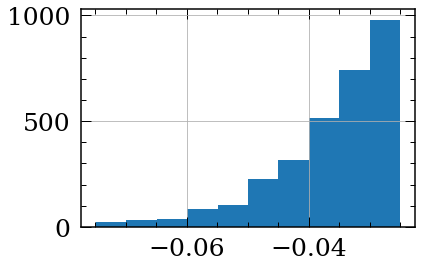

In [134]:
df_gas['ALPHA_M'].hist()

In [157]:

spacex=np.linspace(-5,5,20)
spacey=np.linspace(-5,5,20)
spacez=np.linspace(-2,2,10)
x=[]
y=[]
z=[]
ages=[]
for i in trange(len(spacex)-1):
    df_x=df.loc[df['X']>spacex[i]]
    df_x=df_x.loc[df_x['X']<spacex[i+1]]
    for j in range(len(spacey)-1):
        df_y=df_x.loc[df_x['Y']>spacey[j]]
        df_y=df_y.loc[df_y['Y']<spacey[j+1]]
        for k in range(len(spacez)-1):
            df_z=df_y.loc[df_y['z']>spacez[k]]
            df_z=df_z.loc[df_z['z']<spacez[k+1]]
            x.append(spacex[i]/2+spacex[i+1]/2)
            y.append(spacey[j]/2+spacey[j+1]/2)
            z.append(spacez[k]/2+spacez[k+1]/2)
            #print(len(df_z))
            ages.append(np.mean(df_z['Age'].dropna()))


            



  0%|          | 0/19 [00:00<?, ?it/s]

  5%|▌         | 1/19 [00:02<00:36,  2.05s/it]

 11%|█         | 2/19 [00:02<00:28,  1.69s/it]

 16%|█▌        | 3/19 [00:03<00:22,  1.38s/it]

 21%|██        | 4/19 [00:04<00:18,  1.23s/it]

 26%|██▋       | 5/19 [00:05<00:15,  1.12s/it]

 32%|███▏      | 6/19 [00:06<00:13,  1.04s/it]

 37%|███▋      | 7/19 [00:06<00:11,  1.05it/s]

 42%|████▏     | 8/19 [00:07<00:09,  1.12it/s]

 47%|████▋     | 9/19 [00:08<00:08,  1.15it/s]

 53%|█████▎    | 10/19 [00:09<00:08,  1.05it/s]

 58%|█████▊    | 11/19 [00:13<00:15,  1.92s/it]

 63%|██████▎   | 12/19 [00:16<00:15,  2.24s/it]

 68%|██████▊   | 13/19 [00:18<00:13,  2.17s/it]

 74%|███████▎  | 14/19 [00:19<00:08,  1.75s/it]

 79%|███████▉  | 15/19 [00:20<00:05,  1.43s/it]

 84%|████████▍ | 16/19 [00:20<00:03,  1.18s/it]

 89%|████████▉ | 17/19 [00:21<00:01,  1.01it/s]

 95%|█████████▍| 18/19 [00:21<00:00,  1.17it/s]

100%|██████████| 19/19 [00:22<00:00,  1.18s/it]


In [158]:
df_indage=pd.DataFrame(np.array((x,y,z,ages)).T,columns=['x','y','z','age'])
df_indage=df_indage.dropna(subset=['age'])
df_indage=df_indage.sort_values(by='age').reset_index(drop=True)
#df_indage

In [159]:
len(df_indage)

1618

In [160]:
agediff=0.01

In [161]:
age_size=int((max(df_indage['age'])-min(df_indage['age']))/agediff)
age_size

978

In [162]:
newages=[]
newx=[]
newy=[]
newz=[]
minage=min(df_indage['age'])
           
for i in range(age_size-1):
    m1=df_indage['age']>min(df_indage['age'])+i*agediff
    m2=df_indage['age']<min(df_indage['age'])+(i+1)*agediff
    m=m1&m2
    newages.append(np.mean(df_indage['age'][m]))
    newx.append(np.mean(df_indage['x'][m]))
    newy.append(np.mean(df_indage['y'][m]))
    newz.append(np.mean(df_indage['z'][m]))

In [163]:
newdf=pd.DataFrame(np.array((newx,newy,newz,newages)).T,columns=['x','y','z','age']).dropna().reset_index(drop=True)


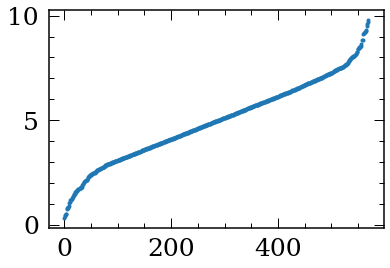

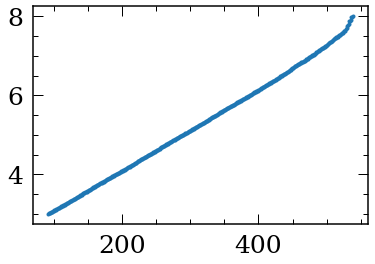

In [165]:
plt.figure()
plt.plot(newdf['age'],'.')
newdf=newdf.loc[newdf['age']>3]
newdf=newdf.loc[newdf['age']<8]

plt.figure()
plt.plot(newdf['age'],'.')

In [88]:
from mpl_toolkits import mplot3d
#%matplotlib inline

locind=1
for i in trange(len(newdf)):
    locind=i
    fig = plt.figure(figsize=(10,8))
    ax = plt.axes(projection='3d')
    ax.scatter(0,0,0, 'o',c='k')
    ax.scatter(newdf['x'].iloc[locind], newdf['y'].iloc[locind], 
          newdf['z'].iloc[locind], 'o',c='r')
    ax.plot(newdf['x'].iloc[:locind], newdf['y'].iloc[:locind], 
          newdf['z'].iloc[:locind],'--k',alpha=0.3)
    ax.set_xlim([-5,5])
    ax.set_ylim([-5,5])
    ax.set_zlim([-2,2])
    plt.title('Time:%.2f Gyr'%newdf['age'].iloc[locind])
    plt.savefig('figsformovies/image_%d.png'%i)
    plt.tight_layout()
    close(fig)



100%|██████████| 387/387 [01:56<00:00,  3.34it/s]


In [166]:
newdf['x']=newdf['x']-8.2




  0%|          | 0/447 [00:00<?, ?it/s]


  0%|          | 1/447 [00:00<02:19,  3.19it/s]


  0%|          | 2/447 [00:00<02:12,  3.36it/s]


  1%|          | 3/447 [00:00<02:12,  3.36it/s]


  1%|          | 4/447 [00:01<02:17,  3.21it/s]


  1%|          | 5/447 [00:01<03:03,  2.40it/s]


  1%|▏         | 6/447 [00:02<02:41,  2.73it/s]


  2%|▏         | 7/447 [00:02<02:27,  2.98it/s]


  2%|▏         | 8/447 [00:02<02:17,  3.20it/s]


  2%|▏         | 9/447 [00:02<02:08,  3.41it/s]


  2%|▏         | 10/447 [00:03<02:01,  3.59it/s]


  2%|▏         | 11/447 [00:03<01:57,  3.72it/s]


  3%|▎         | 12/447 [00:03<01:56,  3.74it/s]


  3%|▎         | 13/447 [00:03<01:54,  3.78it/s]


  3%|▎         | 14/447 [00:04<01:52,  3.87it/s]


  3%|▎         | 15/447 [00:04<01:51,  3.87it/s]


  4%|▎         | 16/447 [00:04<01:52,  3.84it/s]


  4%|▍         | 17/447 [00:04<01:55,  3.74it/s]


  4%|▍         | 18/447 [00:05<01:52,  3.81it/s]


  4%|▍         | 19/447 [00:05<01:51,  3.85it/




  8%|▊         | 37/447 [00:10<01:54,  3.57it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



  9%|▊         | 38/447 [00:10<01:53,  3.62it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



  9%|▊         | 39/447 [00:11<01:55,  3.54it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Fig




 13%|█▎        | 57/447 [00:17<02:10,  3.00it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 13%|█▎        | 58/447 [00:17<02:07,  3.05it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 13%|█▎        | 59/447 [00:17<02:00,  3.22it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Fig




 17%|█▋        | 77/447 [00:23<01:43,  3.56it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 17%|█▋        | 78/447 [00:23<01:42,  3.60it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 18%|█▊        | 79/447 [00:23<01:41,  3.62it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Fig




 22%|██▏       | 97/447 [00:29<02:10,  2.69it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 22%|██▏       | 98/447 [00:29<01:58,  2.95it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 22%|██▏       | 99/447 [00:29<01:54,  3.04it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Fig




 26%|██▌       | 117/447 [00:36<02:00,  2.74it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 26%|██▋       | 118/447 [00:36<02:01,  2.70it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 27%|██▋       | 119/447 [00:36<02:01,  2.69it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 31%|███       | 137/447 [00:43<01:48,  2.85it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 31%|███       | 138/447 [00:43<01:56,  2.66it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 31%|███       | 139/447 [00:44<01:51,  2.77it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 35%|███▌      | 157/447 [00:50<01:33,  3.10it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 35%|███▌      | 158/447 [00:51<01:28,  3.26it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 36%|███▌      | 159/447 [00:51<01:33,  3.08it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 40%|███▉      | 177/447 [00:58<01:27,  3.09it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 40%|███▉      | 178/447 [00:58<01:22,  3.25it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 40%|████      | 179/447 [00:58<01:25,  3.13it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 44%|████▍     | 197/447 [01:06<01:58,  2.11it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 44%|████▍     | 198/447 [01:06<01:47,  2.32it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 45%|████▍     | 199/447 [01:07<01:40,  2.47it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 49%|████▊     | 217/447 [01:13<01:11,  3.23it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 49%|████▉     | 218/447 [01:13<01:09,  3.31it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 49%|████▉     | 219/447 [01:13<01:09,  3.30it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 53%|█████▎    | 237/447 [01:19<01:05,  3.22it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 53%|█████▎    | 238/447 [01:19<01:06,  3.16it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 53%|█████▎    | 239/447 [01:20<01:05,  3.18it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 57%|█████▋    | 257/447 [01:26<01:03,  2.99it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 58%|█████▊    | 258/447 [01:27<01:01,  3.07it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 58%|█████▊    | 259/447 [01:27<00:59,  3.16it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 62%|██████▏   | 277/447 [01:32<00:53,  3.20it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 62%|██████▏   | 278/447 [01:33<00:56,  3.01it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 62%|██████▏   | 279/447 [01:33<00:53,  3.15it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 66%|██████▋   | 297/447 [01:39<00:44,  3.40it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 67%|██████▋   | 298/447 [01:39<00:49,  3.03it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 67%|██████▋   | 299/447 [01:39<00:56,  2.64it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 71%|███████   | 317/447 [01:46<00:43,  3.01it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 71%|███████   | 318/447 [01:46<00:43,  2.99it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 71%|███████▏  | 319/447 [01:47<00:42,  3.04it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 75%|███████▌  | 337/447 [01:53<00:32,  3.36it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 76%|███████▌  | 338/447 [01:53<00:31,  3.45it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 76%|███████▌  | 339/447 [01:53<00:30,  3.52it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 80%|███████▉  | 357/447 [01:59<00:26,  3.44it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 80%|████████  | 358/447 [01:59<00:27,  3.29it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 80%|████████  | 359/447 [01:59<00:27,  3.18it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 84%|████████▍ | 377/447 [02:05<00:19,  3.64it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 85%|████████▍ | 378/447 [02:05<00:19,  3.63it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 85%|████████▍ | 379/447 [02:05<00:18,  3.60it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 89%|████████▉ | 397/447 [02:10<00:13,  3.69it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 89%|████████▉ | 398/447 [02:10<00:13,  3.63it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 89%|████████▉ | 399/447 [02:11<00:13,  3.62it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 93%|█████████▎| 417/447 [02:18<00:16,  1.79it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 94%|█████████▎| 418/447 [02:18<00:14,  1.99it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 94%|█████████▎| 419/447 [02:18<00:12,  2.22it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 




 98%|█████████▊| 437/447 [02:25<00:03,  2.51it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 98%|█████████▊| 438/447 [02:25<00:03,  2.76it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys



 98%|█████████▊| 439/447 [02:25<00:02,  2.93it/s]/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. 

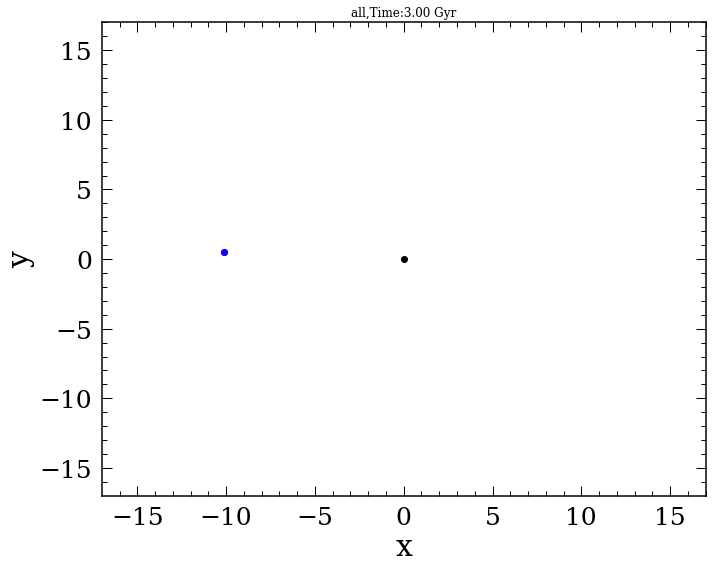

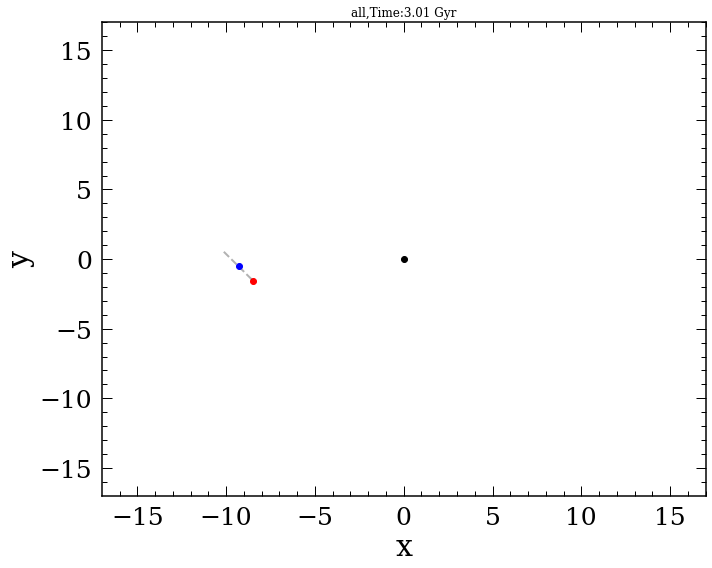

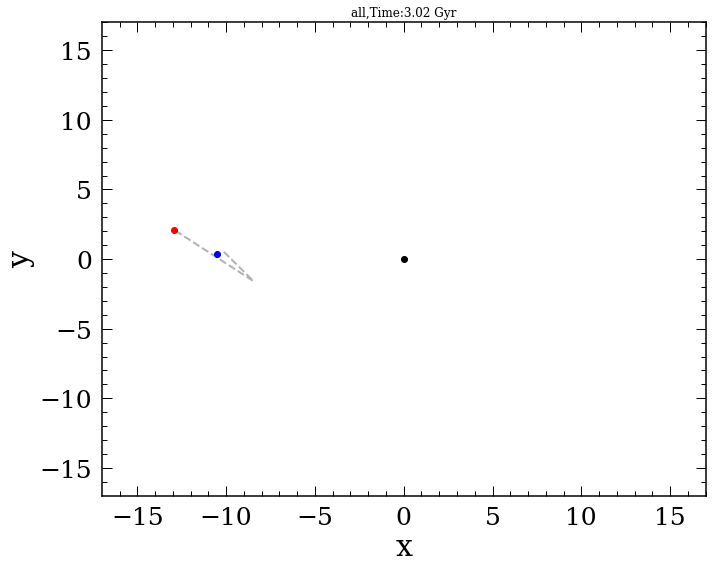

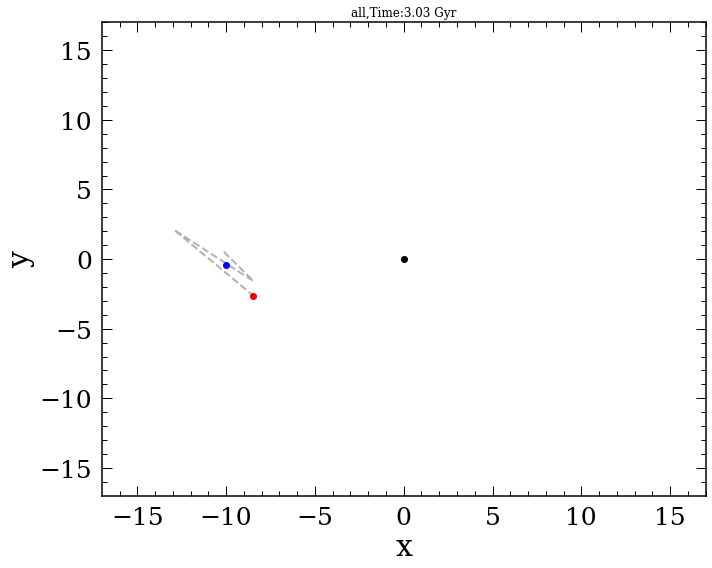

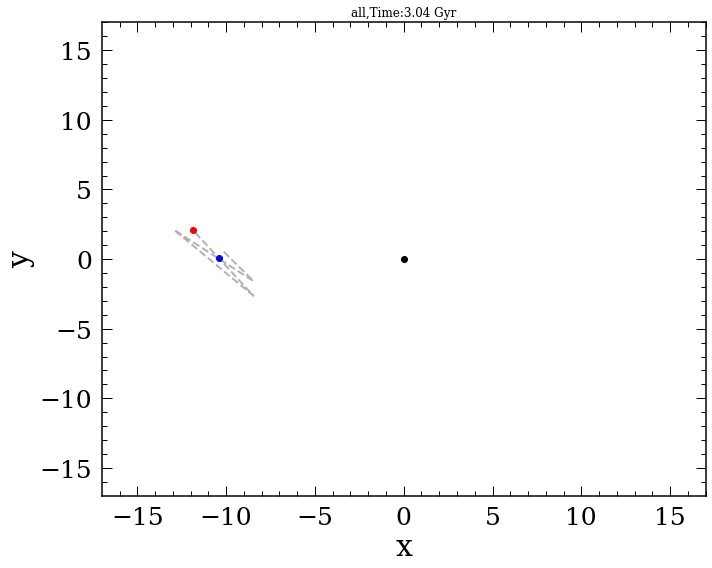

...

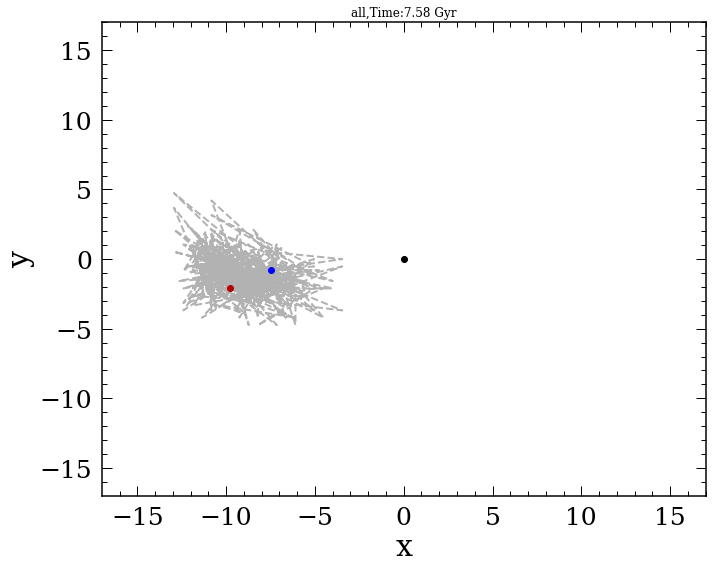

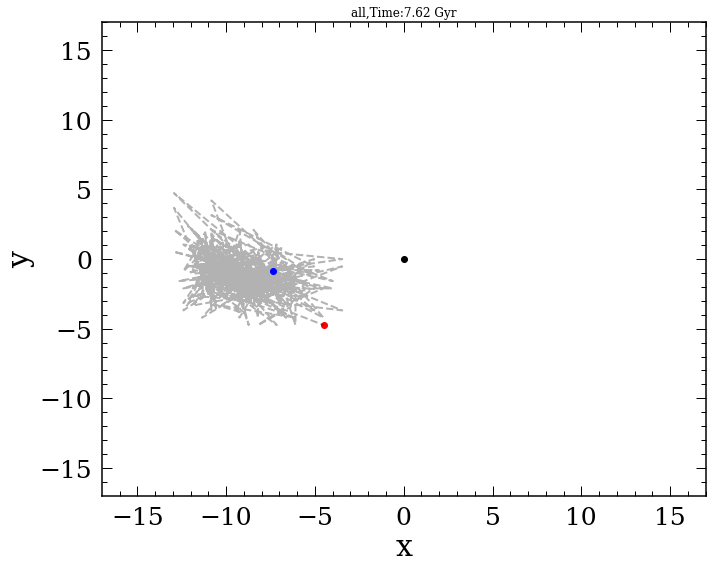

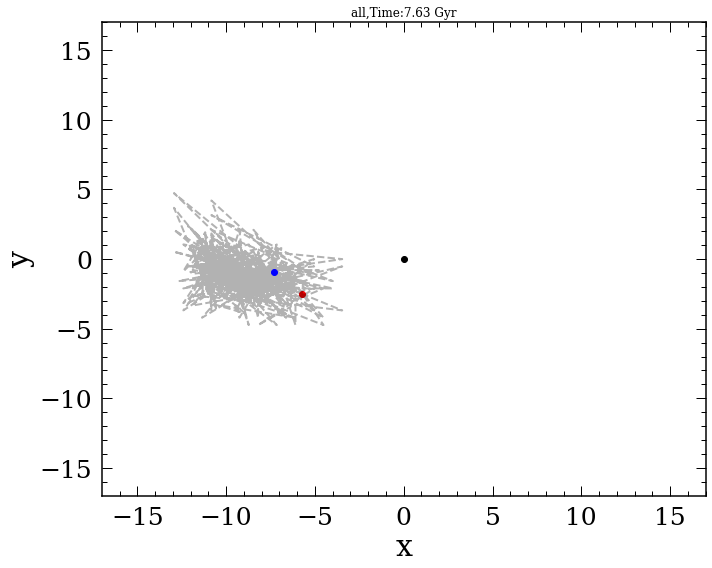

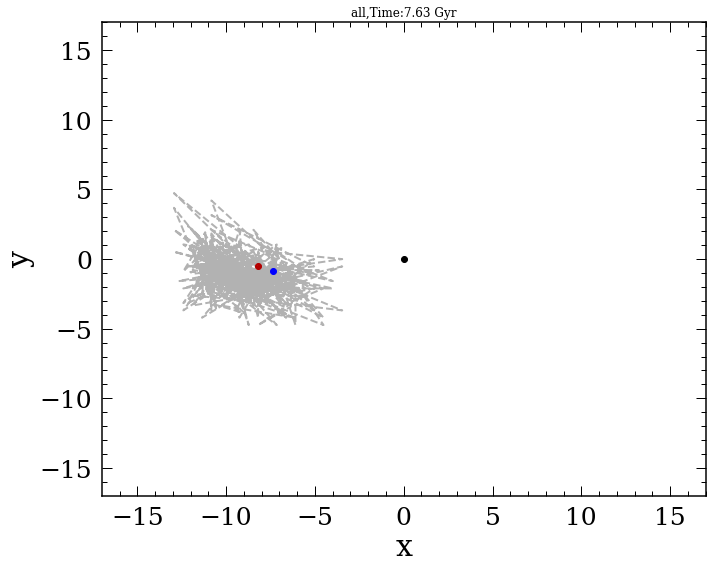

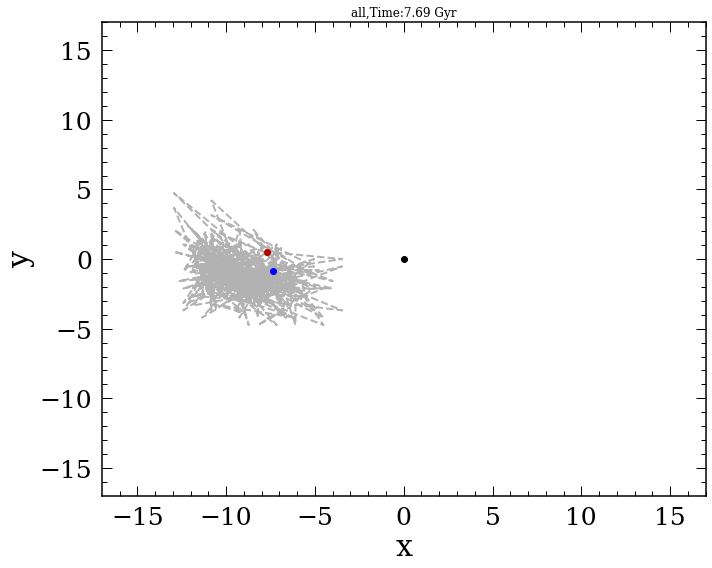

Error in callback <function flush_figures at 0x11e3626a8> (for post_execute):


KeyboardInterrupt: 

In [169]:
from mpl_toolkits import mplot3d
#%matplotlib inline

locind=1
for i in trange(len(newdf)):
    locind=i
    plt.figure(figsize=(10,8))
    plt.scatter(0,0, c='k')
    plt.scatter(newdf['x'].iloc[locind], newdf['y'].iloc[locind],c='r')
    plt.plot(newdf['x'].iloc[:(locind+1)], newdf['y'].iloc[:(locind+1)],'--k',alpha=0.3)
    plt.plot(np.mean(newdf['x'].iloc[max((locind+1)-50,0):(locind+1)]), 
             np.mean(newdf['y'].iloc[max((locind+1)-50,0):(locind+1)]),'bo')
    plt.xlim([-17,17])
    #plt.ylim([0,2])
    plt.ylim([-17,17])
    plt.xlabel('x')
    plt.ylabel('y')
    #plt.title('-0.55<Fe<-0.45, 0.15<alpha<0.2,Time:%.2f Gyr'%newdf['age'].iloc[locind])
    #plt.title('-0.1<Fe<-0.1, -0.075<alpha<-0.025,Time:%.2f Gyr'%newdf['age'].iloc[locind])
    plt.title('all,Time:%.2f Gyr'%newdf['age'].iloc[locind])
    plt.savefig('figsformovies/image_xy_%d.png'%i)
    plt.tight_layout()
    plt.close(fig)




<IPython.core.display.Javascript object>


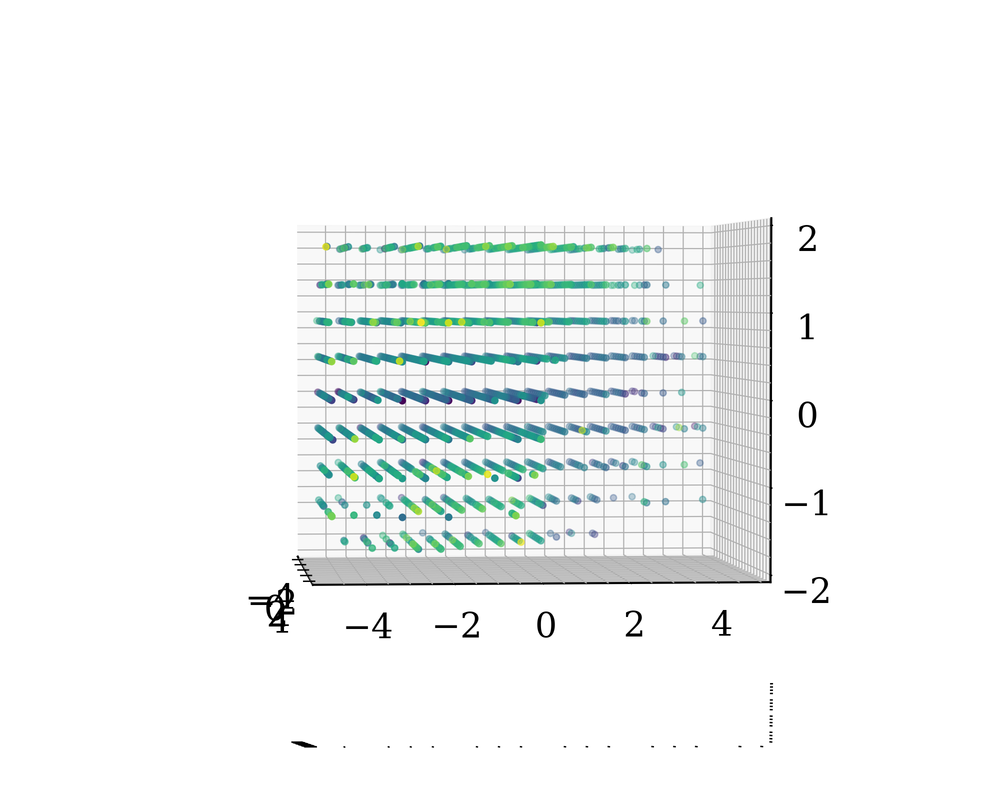

(-2, 2)

In [16]:
from mpl_toolkits import mplot3d
%matplotlib notebook
fig = plt.figure(figsize=(10,8))
ax = plt.axes(projection='3d')
ax.scatter(0,0,0, 'o',c='k')
ax.scatter(df_indage['x'], df_indage['y'], 
          df_indage['z'],c=df_indage['age'])
ax.set_xlim([-5,5])
ax.set_ylim([-5,5])
ax.set_zlim([-2,2])



(-5, 5)

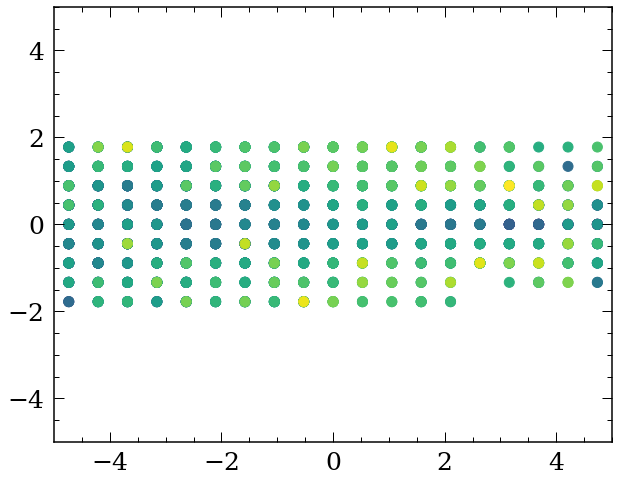

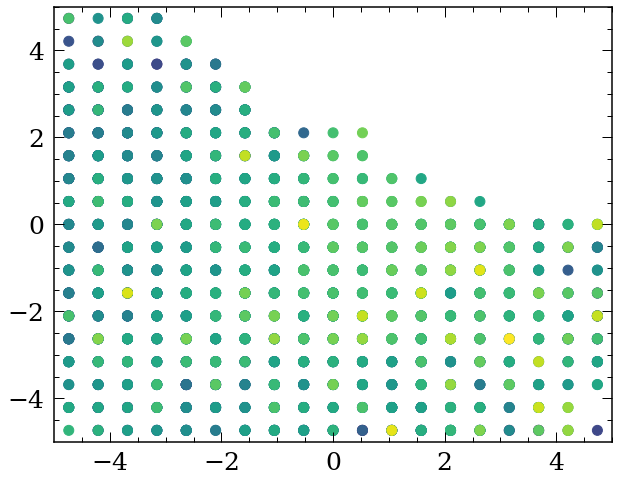

In [24]:
from mpl_toolkits import mplot3d
%matplotlib inline
fig = plt.figure(figsize=(10,8))
plt.scatter(df_indage['x'], df_indage['z'],c=df_indage['age'],s=100)
plt.xlim([-5,5])
plt.ylim([-5,5])

fig = plt.figure(figsize=(10,8))
plt.scatter(df_indage['x'], df_indage['y'],c=df_indage['age'],s=100)
plt.xlim([-5,5])
plt.ylim([-5,5])




/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: RuntimeWarning: invalid value encountered in true_divide


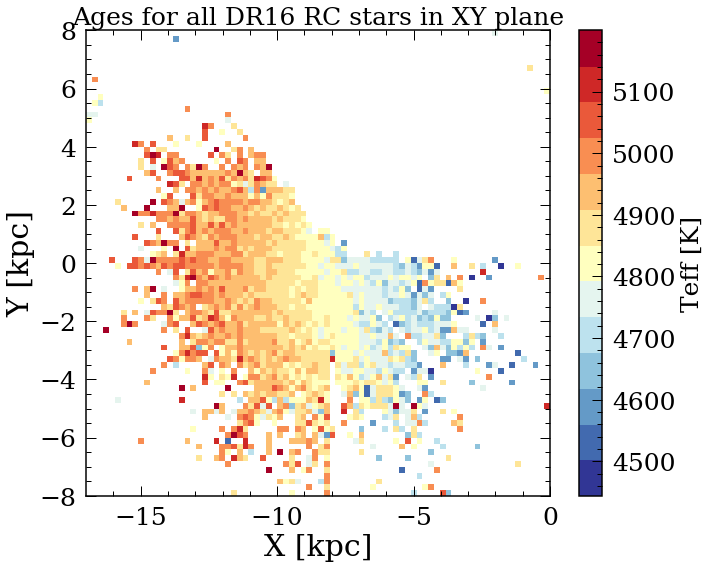

In [235]:
df_rc=df.loc[df['DP']>230]
df_rc=df_rc.loc[abs(df_rc['z'])<1]

x1,x2,y1,y2 = -17,0,-8,8
lims = [x1,x2,y1,y2]
lims = np.array(lims)
binnum = 80
cmap1 = plt.cm.get_cmap('RdYlBu_r',13)
cmap1.set_bad('white',1.)
image=makeagemap_each(df_rc['X'].values-8.2,df_rc['Y'].values,
                df_rc['TEFF'].values,lims, binnum)
plt.figure(figsize=(10,8))
x1m,x2m,y1m,y2m = lims[0], lims[1], lims[2], lims[3]
plt.imshow(image.T, interpolation="nearest" ,aspect = 'auto',origin = 'lower', 
                   extent = (x1m,x2m, y1m,y2m),cmap=cmap1)
plt.xlabel('X [kpc]')
plt.ylabel('Y [kpc]')
plt.xlim([x1m,x2m])
plt.ylim([y1m,y2m])

cb=plt.colorbar()
fs = 25
cb.set_label('Teff [K]',fontsize = fs,labelpad = 5)
plt.title('Ages for all DR16 RC stars in XY plane',fontsize=25)
plt.tight_layout()


df_as=pd.read_pickle('ASstars.pkl')
def convd2R(x):
    return x/180*np.pi

#df_as['X'] = df_as.GAIA_R_EST * np.cos(convd2R(df_as.GLAT)) * np.cos(convd2R(df_as.GLON)) / 1000.
#df_as['Y'] = -df_as.GAIA_R_EST * np.sin(convd2R(df_as.GLON)) * np.cos(convd2R(df_as.GLAT))/ 1000.
#df_as['z'] = df_as.GAIA_R_EST * np.sin(convd2R(df_as.GLAT))/ 1000.
#df_as['R'] = np.sqrt(np.power(df_as.X - 8.2,2.) + np.power(df_as.Y,2.))

#plt.plot(df_as['X']-8.2,df_as['Y'],'r.',alpha=0.1)



plt.savefig('age_grad_xy.png')

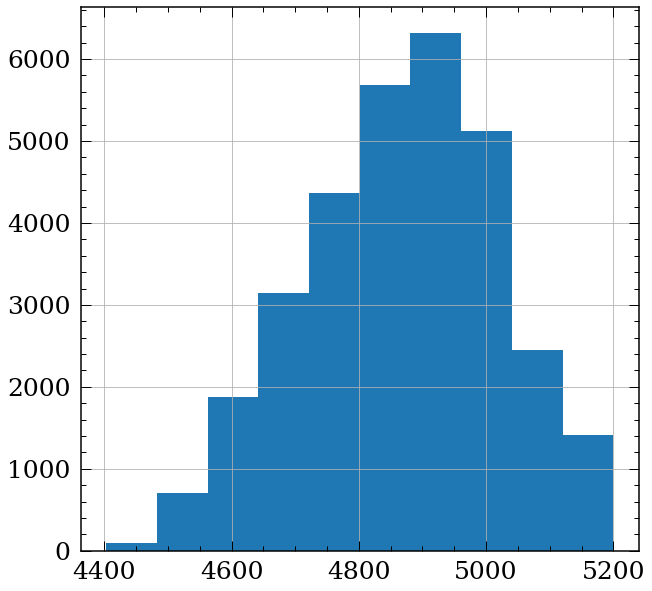

In [238]:
df_rc['TEFF'].hist()

In [300]:
df_rc_u_calc=df_rc_u.loc[df_rc_u['X']>binsx[0]]
df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['X']<binsx[1]]
df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['Y']>binsy[1]]
df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['Y']<binsy[2]]
df_rc_u_calc

,ID,[Fe/H],T_{eff},Log(g),[Mg/Fe],DP,Dnu,LogAge,[Fe/H]_err,T_{eff}_err,...,LOGG_SPEC,FLAGREAD,X,Y,z,R,Age,Age_err,LogAge_upp,LogAge_low
46246,2M05434067+5427166,-0.256666,4935.705366,2.502773,0.041823,307.924204,3.915577,3.559067,0.015363,0.032904,...,2.7931,0,-9.900910,-0.697910,0.415155,9.925477,3.622987,1.915415,6013.567053,2182.737445
54181,2M07104945+5602097,-0.353483,5113.347282,2.733252,0.194361,264.241756,5.291659,3.839729,0.017620,0.039416,...,3.0750,0,-9.855823,-0.577523,0.812050,9.872729,6.913991,3.450901,11178.253313,4276.452270
86734,2M07392621+6010015,-0.318181,4920.054379,2.454400,0.052548,294.972072,4.179092,3.563180,0.015278,0.032263,...,2.7521,0,-9.778703,-0.676479,0.959249,9.802074,3.657465,1.903276,6026.322258,2219.770165
122035,2M05095724+4551449,-0.016775,4975.947239,2.695033,-0.003559,278.536735,5.548979,3.170666,0.014594,0.038389,...,3.0474,0,-9.994447,-0.582601,0.116609,10.011413,1.481379,0.784028,2460.089470,892.034017
142958,2M07343117+5746373,-0.167297,4936.939414,2.527665,0.011172,261.008537,4.395793,3.249996,0.015771,0.039003,...,2.8195,0,-9.860146,-0.622401,0.955558,9.879770,1.778262,0.987031,3020.855554,1046.794454
166974,2M05510837+5234375,-0.324668,4882.049973,2.424965,0.091338,325.757238,4.040636,3.690364,0.013949,0.026737,...,2.7778,0,-9.966346,-0.645502,0.427106,9.987228,4.901891,2.491390,7990.076275,3007.297164
206279,2M05070148+4922119,-0.094774,4929.770352,2.536238,-0.022147,306.161823,5.076904,3.386326,0.014037,0.031332,...,2.8716,0,-9.893793,-0.653917,0.166043,9.915379,2.434031,1.277029,4025.720961,1471.663755
206432,2M05135618+4818269,-0.412344,4991.513211,2.443572,0.140451,327.628245,4.646064,3.358130,0.016856,0.037320,...,2.7877,0,-9.802285,-0.569759,0.164334,9.818830,2.281027,1.225893,3815.468049,1363.681958
233897,2M04490723+4529274,0.018428,4894.086828,2.598964,-0.049942,279.766272,4.600499,3.096648,0.012826,0.031736,...,2.9299,0,-9.908925,-0.620099,0.014152,9.928309,1.249246,0.648062,2055.399175,759.276036


In [305]:
df_rc=df.loc[df['DP']>230]
df_rc_teff=df_rc.loc[abs(df_rc['TEFF']-4950)<50]
df_rc_teff['X']=df_rc_teff['X']-8.2

df_rc_u=df_rc_teff.loc[(df_rc_teff['z'])>0]
df_rc_u=df_rc_u.loc[(df_rc_u['z'])<1]
df_rc_l=df_rc_teff.loc[(df_rc_teff['z'])>-1]
df_rc_l=df_rc_l.loc[(df_rc_l['z'])<0]

print(len(df_rc_u),len(df_rc_l))

binsx=np.linspace(-10,-8,20)
binsy=np.linspace(-1,1,20)

xs=[]
ys=[]
diffmg=[]

for i in range(len(binsx)-1):
    
    #print(len(df_rc_u_calc),len(df_rc_l_calc))
    for j in range(len(binsy)-1):
        df_rc_u_calc=df_rc_u.loc[df_rc_u['X']>binsx[i]]
        df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['X']<binsx[i+1]]
    
        df_rc_l_calc=df_rc_l.loc[df_rc_l['X']>binsx[i]]
        df_rc_l_calc=df_rc_l_calc.loc[df_rc_l_calc['X']<binsx[i+1]]
    
        df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['Y']>binsy[j]]
        df_rc_u_calc=df_rc_u_calc.loc[df_rc_u_calc['Y']<binsy[j+1]]
        
        df_rc_l_calc=df_rc_l_calc.loc[df_rc_l_calc['Y']>binsy[j]]
        df_rc_l_calc=df_rc_l_calc.loc[df_rc_l_calc['Y']<binsy[j+1]]
        
        #print(len(df_rc_u_calc),len(df_rc_l_calc))
        
        xs.append(binsx[i]/2+binsx[i+1]/2)
        ys.append(binsy[j]/2+binsy[j+1]/2)
        diffmg.append(np.mean(df_rc_u_calc['MG_FE'].dropna())-np.mean(df_rc_l_calc['MG_FE'].dropna()))
        

/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


4566 3207


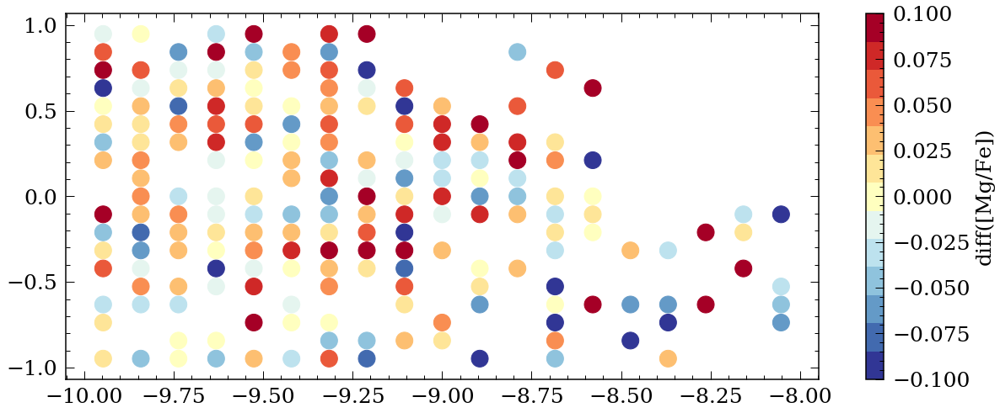

In [315]:
plt.figure(figsize=(20,8))
plt.scatter(xs,ys,c=diffmg,vmin=-0.1,vmax=0.1,cmap=cmap1,s=400)
cb=plt.colorbar()
fs = 25
cb.set_label('diff([Mg/Fe])',fontsize = fs,labelpad = 5)

/Users/lucy/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:101: RuntimeWarning: invalid value encountered in true_divide


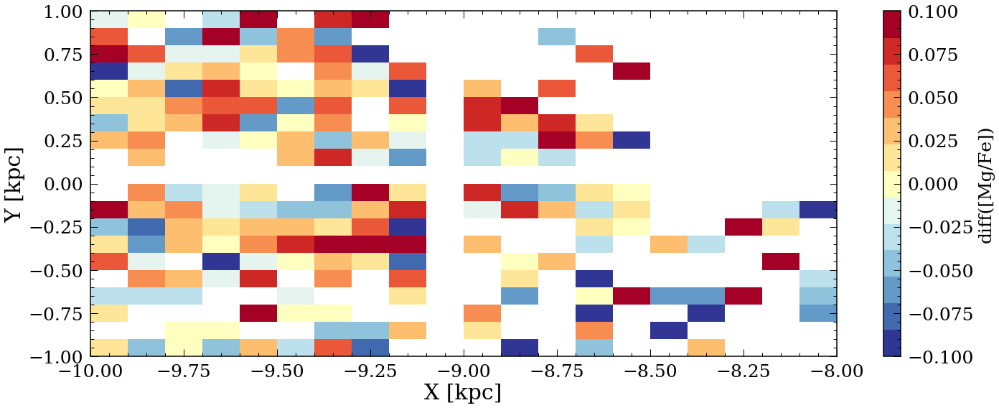

In [311]:
x1,x2,y1,y2 = -10,-8,-1,1
lims = [x1,x2,y1,y2]
lims = np.array(lims)
binnum = 20
cmap1 = plt.cm.get_cmap('RdYlBu_r',13)
cmap1.set_bad('white',1.)
image=makeagemap_each(xs,ys,
                diffmg,lims, binnum)
plt.figure(figsize=(20,8))
x1m,x2m,y1m,y2m = lims[0], lims[1], lims[2], lims[3]
plt.imshow(image.T, interpolation="nearest" ,aspect = 'auto',origin = 'lower', 
                   extent = (x1m,x2m, y1m,y2m),cmap=cmap1,vmin=-0.1,vmax=0.1)
plt.xlabel('X [kpc]')
plt.ylabel('Y [kpc]')
plt.xlim([x1m,x2m])
plt.ylim([y1m,y2m])

cb=plt.colorbar()
fs = 25
cb.set_label('diff([Mg/Fe])',fontsize = fs,labelpad = 5)

plt.tight_layout()


# seperate by different high/low

12969 70168 83137


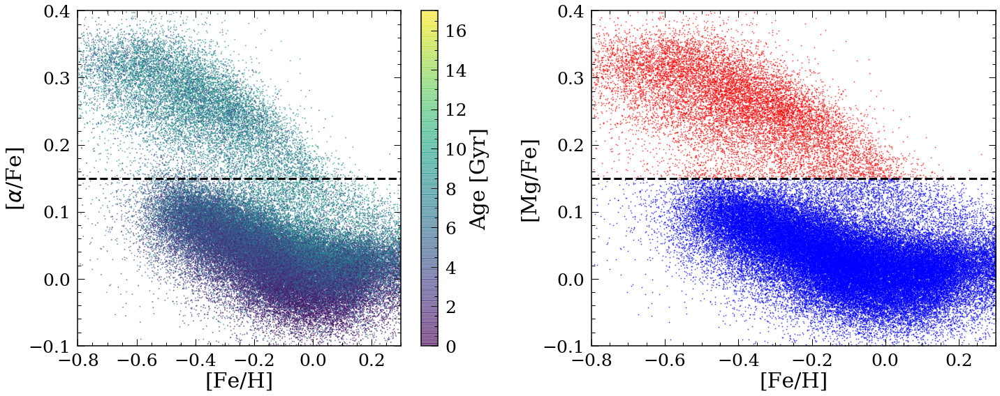

In [12]:
#p=fitpoints([-0.75,0.11],[0.15,0.05])
p=fitpoints([-0.75,0.11],[0.15,0.15])

plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
cm = plt.cm.get_cmap('viridis',5)
plt.scatter(df['M_H'],df['MG_FE'],c=df['Age'],s=1,vmin=0,vmax=17,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[$\\alpha$/Fe]')
cb=plt.colorbar()
cb.set_label('Age [Gyr]')


high_alpha=df[df['MG_FE']-p(df['M_H'])>=0]
low_alpha=df[df['MG_FE']-p(df['M_H'])<0]
print(len(high_alpha),len(low_alpha),len(df))

plt.subplot(1,2,2)
plt.scatter(high_alpha['M_H'],high_alpha['MG_FE'],c='r',s=1,alpha=0.5)
plt.scatter(low_alpha['M_H'],low_alpha['MG_FE'],c='b',s=1,alpha=0.5)
plt.plot([-0.8,0.3],p([-0.8,0.3]),'k--',linewidth=3)
plt.xlim([-0.8,0.3])
plt.ylim([-0.1,0.4])
plt.xlabel('[Fe/H]')
plt.ylabel('[Mg/Fe]')

plt.tight_layout()


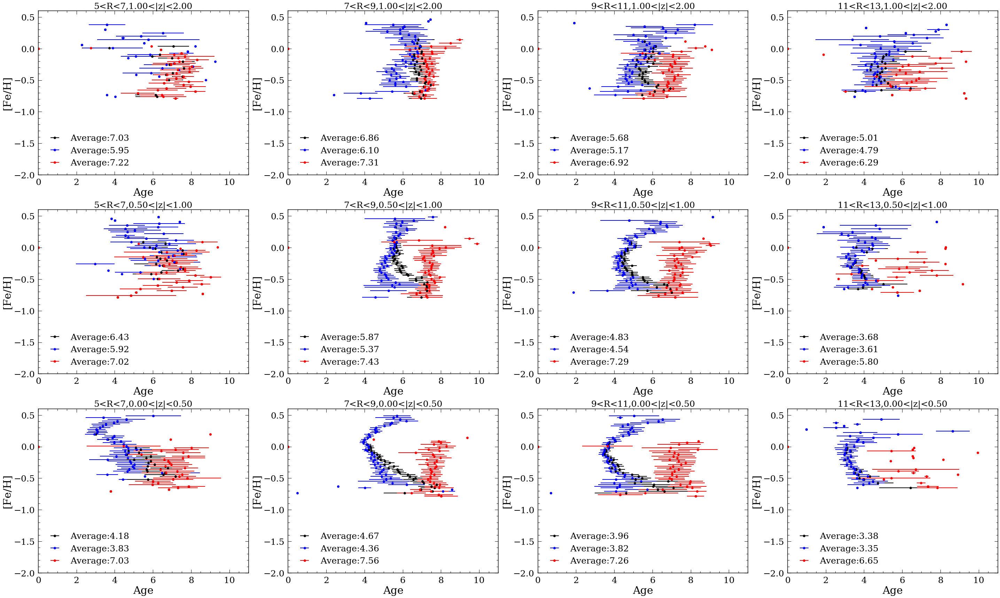

In [13]:
#Rbin=[5,7,9,11,13]
#zbin=[0,0.5,1,2]
Rbin=[2,1,0.5,0]
zbin=[5,7,9,11,13]
plt.figure(figsize=(40,24))
count=1
for i in range(len(Rbin)-1):
    df_all=df.loc[df['z']>Rbin[i+1]]
    df_all=df_all.loc[df_all['z']<Rbin[i]]
        
    for j in range(len(zbin)-1):
        df_all_z=df_all.loc[abs(df_all['R'])>zbin[j]]
        df_all_z=df_all_z.loc[abs(df_all_z['R'])<zbin[j+1]]
        
        df_all_z=df_all_z.dropna(subset=['M_H','Age'])
        
        ha_bin_z=df_all_z[df_all_z['MG_FE']-p(df_all_z['M_H'])>=0]
        la_bin_z=df_all_z[df_all_z['MG_FE']-p(df_all_z['M_H'])<0]
        
        #meanfeh,meanage,meanage_err,starnumb=getave_age(df_all_z['Age'].values,df_all_z['M_H'].values)
        allage=np.append(la_bin_z['Age'].values,ha_bin_z['Age'].values)
        allmh=np.append(la_bin_z['M_H'].values,ha_bin_z['M_H'].values)
        meanfeh,meanage,meanage_err,starnumb=getave_age(allage,allmh)
        meanfeh_la,meanage_la,meanage_err_la,starnumb_la=getave_age(la_bin_z['Age'].values,
                                                                    la_bin_z['M_H'].values)
        meanfeh_ha,meanage_ha,meanage_err_ha,starnumb_ha=getave_age(ha_bin_z['Age'].values,
                                                                    ha_bin_z['M_H'].values)
        clear_output(wait = True)
        plt.subplot(3,4,count)
        plt.errorbar(meanage,meanfeh,xerr=meanage_err,fmt='ko',label='Average:%.2f'%np.mean(allage))
        plt.errorbar(meanage_la,meanfeh_la,xerr=meanage_err_la,fmt='bo',label='Average:%.2f'%np.mean(la_bin_z['Age']))
        plt.errorbar(meanage_ha,meanfeh_ha,xerr=meanage_err_ha,fmt='ro',label='Average:%.2f'%np.mean(ha_bin_z['Age']))
        #plt.xlim([0,10])
        #plt.ylim([-2,0.5])
        plt.xlabel('Age')
        plt.ylabel('[Fe/H]')
        #plt.title('All stars',fontsize=25)

        #plt.scatter(ha_bin['Age'],ha_bin['M_H'],c='r',alpha=0.5)
        #plt.scatter(la_bin['Age'],la_bin['M_H'],c='b',alpha=0.5)
        plt.xlim([0,11])
        plt.ylim([-2,0.6])
        plt.legend()
        count=count+1
        plt.title('%d<R<%d,%.2f<|z|<%.2f'%(zbin[j],zbin[j+1],Rbin[i+1],Rbin[i]),fontsize=25)
        plt.tight_layout()
        
plt.savefig('FeAge.png')